In [20]:
#import inbuilt packages
import os
os.chdir("..")
from scipy.stats import bernoulli

from scipy.stats import mvn
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm
import pdb
import pandas as pd
#from sklearn.preprocessing import LabelEncoder
#from sklearn.utils import shuffle
#from sklearn.model_selection import train_test_split
from scipy.stats import norm
from plots import sortedplot as sp
#from tensorflow.python import debug as tf_debug
#import tensorflow.keras.backend as K
from misc.sample import posterior_sample 
#import importlib as imp
from datagen import GaussianDG 
from datagen import NormalMixDG 
from datagen import DataGenerator
#from data.randomParameters import NormalMixRandomParameters as NMixPar1
from data.randomParameters import NormalMixParameters as NMixPar
from random import randint
import seaborn as sns
import pandas as pd

#tf.enable_eager_execution()

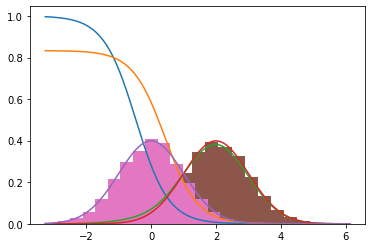

In [15]:
#Vikram, please Start here

#Dataset Generation: Positive set is drawn from N(0,1). The distribution of negatives is a Normal with mean mu,
#standard deviation sig. alpha is the proportion of positives in the Unlabeled set. n_p and n_u are the size of 
#the positive and the unlabeled sets
#pdb.set_trace()
#alpha will be the proportion of positives in the unlabeled set
alpha = 0.05
n_p = 5000
n_u =20000
mu = 2
sig = 1
dg = GaussianDG(mu=mu, sig=sig, alpha=alpha, n_p=n_p, n_u=n_u)
#x contains the one dimensional feature. y contains the PU labels (1: positive, 0:unlabeled) and y_p contains 
#the labels of all positives including the one in the unlabeled set
[x,y,y_p] = dg.pu_data()
#Visualize the PU and PN densities. 

#To generate PN Data
x_p = dg.data_pos(1000)
x_n = dg.data_neg(1000)

#PN posterior. This is what we want to estimate
#sp.sortedplot() sorts the inputs w.r.t the x coordinate before plotting
sp.sortedplot(x, dg.pn_posterior_cc(x))

#PU posterior. This is what we can estimate by training a PU classifier.
sp.sortedplot(x, dg.pu_posterior(x))

sp.sortedplot(x, dg.dens_mix(x, alpha))
sp.sortedplot(x, dg.dens_neg(x))
sp.sortedplot(x, dg.dens_pos(x))
sp.hist(x[(y_p==0).flatten(),:], bins=20, density=True)
sp.hist(x[(y==1).flatten(),:], bins=18, density=True)
sp.show()

In [13]:
#Dataset Generation: Positive set is drawn from N(0,1). The distribution of negatives is a a mixture of Normals. 
#alpha is the proportion of positives in the Unlabeled set. n_p and n_u are the size of the positive and the 
#unlabeled sets
#pdb.set_trace()
alpha = 0.25
n_pos = 500
n_ul =20000
mu_neg = np.array([-4.0, 4.0])
sig_pos = np.array([1.0])
p_pos = np.array([1.0])
mu_pos = np.array([0.0])
sig_neg = np.array([1.0, 1.0])
p_neg = np.array([0.5, 0.5])

dg = NormalMixDG(mu_pos=mu_pos, sig_pos=sig_pos, p_pos=p_pos, mu_neg=mu_neg, sig_neg=sig_neg, p_neg=p_neg,
                 alpha=alpha, n_pos=n_pos, n_ul=n_ul)
#x contains the one dimensional feature. y contains the PU labels and y_p contains the labels of all positives
#including the one in the unlabeled set
[x,y,y_p] = dg.pu_data()

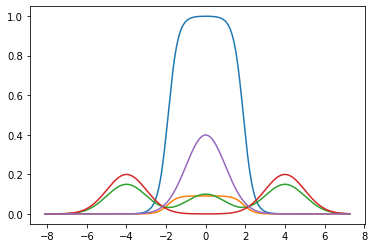

In [4]:
#Visualize the PU and PN densities. 

#PN posterior. This is what we want to estimate
#sp.sortedplot() sorts the inputs w.r.t the x coordinate before plotting
sp.sortedplot(x, dg.pn_posterior_cc(x))

#PU posterior. This is what we can estimate by training a PU classifier.
sp.sortedplot(x, dg.pu_posterior(x))

sp.sortedplot(x, dg.dens_mix(x, alpha))
sp.sortedplot(x, dg.dens_neg(x))
sp.sortedplot(x, dg.dens_pos(x))

sp.show()

### Approximating Irreducibility:
We can quantify irreducibility as the probability mass of the region in the support of the positive density, where the negative density is $0$. This region can be defined in terms of the PN posterior as that region, where the PN posterior takes value of $1$. In theory, this is true irrespective of the value of the class prior. We relax the criteria of defining the region with a PN posterior of $1$ and instead define it with PN Posterior achieving value greater than $a$, for some value of $a$ close to 1. 
\begin{align*}
I_a(f_1,f_0) &= \int \mathbf{I}[p(y=1|x)\geq a] f_1(x)dx\\
 &= \mathbf{E}_{f_1}\big[\mathbf{I}[p(y=1|x)\geq a]\big]
\end{align*}
where $p(y=1|x)$ is the balalnced class posterior, i.e.,
\begin{align*}
p(y=1|x) &= \frac{0.5f_1(x)}{0.5f_1(x) + 0.5 f_0(x)} \\
&= \frac{f_1(x)}{f_1(x) + f_0(x)} 
\end{align*}
Notice that $I_1$ is the probability mass of the region in the support of positives the negatives have $0$ density. However, since Gaussian distribution is supported on the entire $R^d$ space, in theory $I_1$ is $0$. By choosing $a$ to be slightly below $1$ we relax the irreducibility criteria. For the data generation below, we used $a=0.95$

{'aucpn': 0.5, 'irreducibility': 0.0}


/anaconda3/envs/PU/lib/python3.7/site-packages/seaborn/axisgrid.py:2071: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


{'aucpn': 0.5, 'irreducibility': 0.0}
Sigma Shape Perturb
{'aucpn': 0.562073365, 'irreducibility': 0.0035}
Mu Perturb
{'aucpn': 0.5627880000000001, 'irreducibility': 0.0042}
Perturb Proportion
{'aucpn': 0.619888265, 'irreducibility': 0.0046}
Sigma Shape Perturb
{'aucpn': 0.6179287099999999, 'irreducibility': 0.0037}
Sigma Shape Perturb
{'aucpn': 0.6240928649999999, 'irreducibility': 0.0052}
Sigma Shape Perturb
{'aucpn': 0.63705865, 'irreducibility': 0.0058}
Sigma Shape Perturb
{'aucpn': 0.6490529899999999, 'irreducibility': 0.0057}
Perturb Proportion
{'aucpn': 0.65075364, 'irreducibility': 0.0045}
Sigma Shape Perturb
{'aucpn': 0.65298971, 'irreducibility': 0.0052}
Perturb Proportion
{'aucpn': 0.6261483800000001, 'irreducibility': 0.0063}
Perturb Proportion
{'aucpn': 0.6218455199999999, 'irreducibility': 0.004}
Sigma Shape Perturb
{'aucpn': 0.6189552899999999, 'irreducibility': 0.0048}
Sigma Shape Perturb
{'aucpn': 0.64531366, 'irreducibility': 0.0066}
Sigma Shape Perturb
{'aucpn': 0.64

/anaconda3/envs/PU/lib/python3.7/site-packages/seaborn/axisgrid.py:2071: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


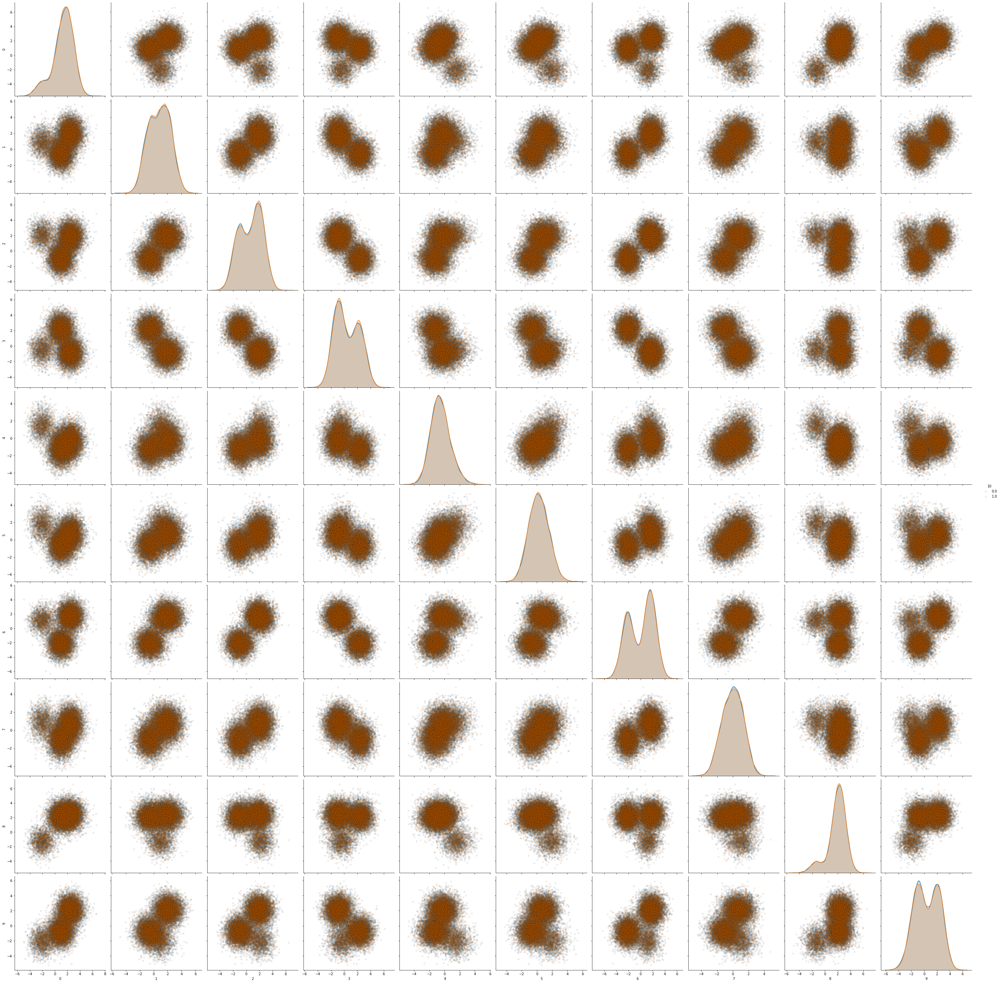

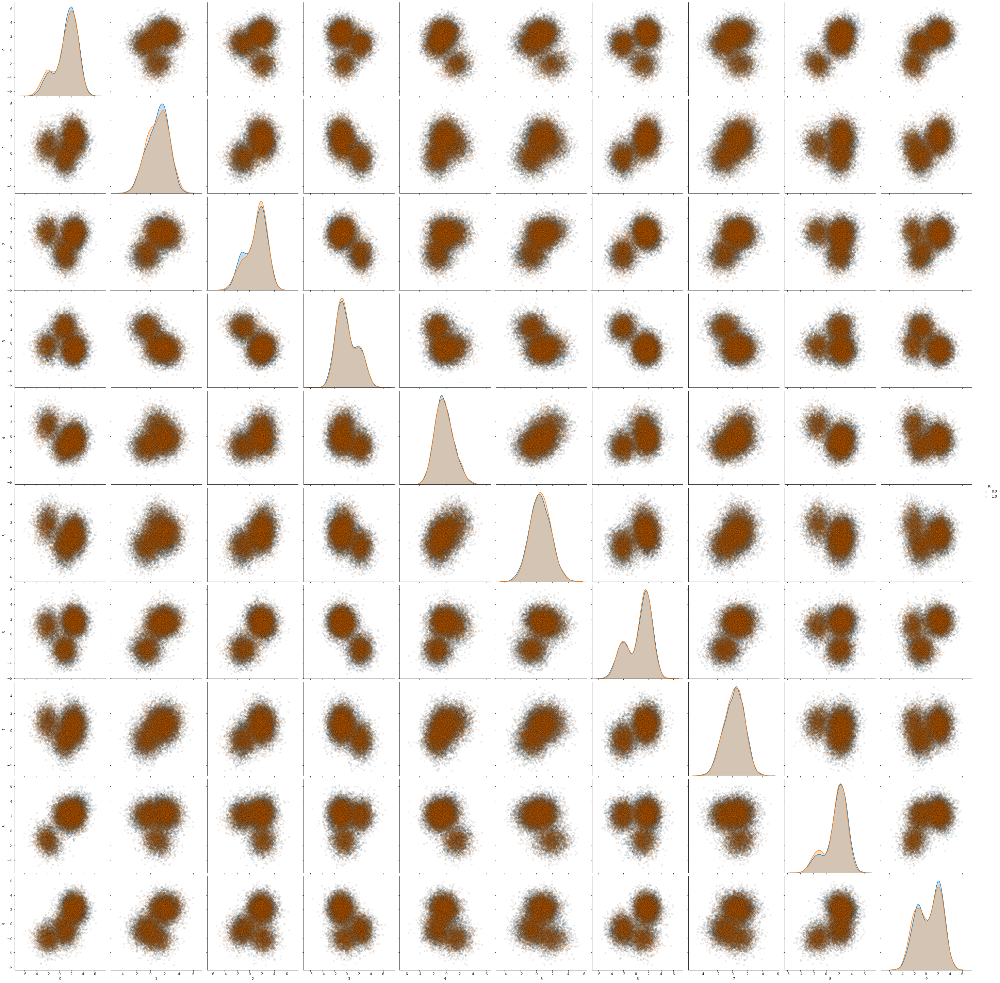

In [5]:
#Create a data generator having positive and negative distribution
#%matplotlib inline
#Set dimensions of the dataset
dim =10
#number of components in the positive and negative distribution
n_comps = 3
#The size of the PN Data for visulization
n=10000
#Create the initial positive negative distributions with components at random locations and identity covariance.
#The distribution of the positives and negatives is identical for the initiallly
NMix = NMixPar(dim, n_comps)
#Compute AUCPN and approximate value of irreducibility.
metrics = NMix.computePNDataMetrics()
print(metrics)
#Generate PN data for visualization. This is the data from initial distributions which has identical 
#positives and negatives
xy, x, y, pos, neg, dg = NMix.generatePNData(n,n)
#Visualize data with pair plots
df = pd.DataFrame(xy)
sns.pairplot(df, vars = np.arange(dim), hue = dim,  plot_kws = {'alpha': 0.1, 's': 20, 'edgecolor': 'k'},
             size = 4)


#Set a desired AUCPN Range. AUCPN is alaways greater then 0.5. I'll suggest starting with values of 0.6, below 
#0.6 the classes are almost identical
aucpn_range = np.array([0.6,0.65])
#Getting parameters in the right AUCPN range and the right Irreducibility range simultaneously is difficult. 
#Keeping the irreducibility range broad makes it easy. I'd suggest keep the irreducibility range to [0.01, 1] 
irreducibility_range = np.array([0.01,1])
#Perturb the parameters of the positive and negative distribution components as well as the the component proportions 
#to achieve desired AUCPN and Irreducibility range
NMix.perturb2SatisfyMetrics(irreducibility_range, aucpn_range)
#Generate PN Data for visulaization. 
xy, x, y, pos, neg, dg = NMix.generatePNData(n,n)
#Compute the metrics
metrics = NMix.computePNDataMetrics()
print(metrics)
#visualize
df = pd.DataFrame(xy)
sns.pairplot(df, vars = np.arange(dim), hue = dim,  plot_kws = {'alpha': 0.1, 's': 20, 'edgecolor': 'k'},
             size = 4)

#Generate the PU Data
n_u = 20000
n_p = 5000
dgPU = NMix.createDataGenerator(n_p, n_u)
#x contains the input features. y contains the PU labels and y_p contains the labels of all positives
#including the one in the unlabeled set
[x,y,y_p] = dgPU.pu_data()
    


In [ ]:
#Code for 3D plot 
ax = plt.axes(projection='3d')
posterior = dg.pn_posterior_balanced(x)
ax.scatter3D(x[:,0], x[:,1], x[:,2], c= posterior > 0.95)
plt.scatter()

In [ ]:
#Multivariate data generator.
from data.randomParameters import NormalMixParameters as NMixPar
def GaussianMixtureDataGenerator(dim, n_comps, aucpn_range, n_p, n_u):
    irreducibility_range = [0.1, 1]
    NMix = NMixPar(dim, n_comps)
    NMix.perturb2SatisfyMetrics(irreducibility_range, aucpn_range)
    dg = NMix.createDataGenerator(n_p, n_u)
    return dg

dim = 2
n_comps = 2
aucpn_range = [0.8, 0.85]
n_p = 5000
n_u = 20000
dg = GaussianMixtureDataGenerator(dim, n_comps, aucpn_range, n_p, n_u)
x, y, y_p = dg.pu_data()